In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import scanpy as sc

In [2]:
samples=['REGION1','REGION2','REGION4','REGION5','REGION6',
        'REGION7','REGION8','REGION9','REGION10','REGION11']

In [3]:
for sample in np.unique(samples):
    adata2=sc.read('F:/Analysis/adata/'+sample+'_adata.h5ad')
    adata2.obs['sample']=sample
    try:
        adata=sc.concat([adata,adata2],join='outer')
    except:
        adata=adata2
    print(adata.shape)

C:\Users\sergio.salas\Miniconda3\lib\site-packages\anndata\_core\anndata.py:119: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
Observation names are not unique. To make them unique, call `.obs_names_make_unique`.


(1944, 262)
(2886, 263)
(3944, 264)


Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
Observation names are not unique. To make them unique, call `.obs_names_make_unique`.


(4873, 264)
(9168, 264)


Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
Observation names are not unique. To make them unique, call `.obs_names_make_unique`.


(10517, 264)
(13517, 264)


Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
Observation names are not unique. To make them unique, call `.obs_names_make_unique`.


(16308, 264)
(19388, 264)


Observation names are not unique. To make them unique, call `.obs_names_make_unique`.


(20647, 264)


In [4]:
adata.X=np.nan_to_num(adata.X,0)

In [5]:
dic={'REGION1':'H','REGION2':'H','REGION4':'H','REGION5':'H',
'REGION6':'H','REGION7':'A','REGION8':'A','REGION9':'A','REGION10':'A','REGION11':'A'}

In [6]:
dicnum={'REGION1':'51','REGION2':'52','REGION4':'35','REGION5':'37',
'REGION6':'81','REGION7':'49','REGION8':'94','REGION9':'96','REGION10':'48','REGION11':'90'}

In [7]:
adata.obs['condition']=adata.obs['sample'].map(dic)
adata.obs['number']=adata.obs['sample'].map(dicnum)
adata.obs['sample_ID']=adata.obs['sample']+'_'+adata.obs['sample'].map(dicnum)+adata.obs['condition']

In [34]:
adata.write('F:/Analysis/adata/adata_10asthma_unprocessed.h5ad')

... storing 'sample' as categorical
... storing 'condition' as categorical
... storing 'number' as categorical
... storing 'sample_ID' as categorical
... storing 'leiden' as categorical


In [54]:
adata=sc.read('F:/Analysis/adata/adata_10asthma_unprocessed.h5ad')

Observation names are not unique. To make them unique, call `.obs_names_make_unique`.


In [55]:
adata

AnnData object with n_obs × n_vars = 38526 × 264
    obs: 'cell', 'x', 'y', 'cluster', 'n_transcripts', 'density', 'elongation', 'area', 'avg_confidence', 'sample', 'condition', 'number', 'sample_ID', 'total_counts', 'n_genes', 'leiden'
    obsm: 'X_pca', 'X_umap'

In [56]:
maximum_numbers_of_reads=100
minimum_number_of_reads=3
import seaborn as sns
adata.obs['total_counts']=list(np.sum(adata.X,axis=1))
#sns.displot(adata.obs,x='total_counts')
#plt.axvline(x=maximum_numbers_of_reads,color='green',linestyle='--')
#plt.axvline(x=minimum_number_of_reads,color='red',linestyle='--')
adata=adata[adata.obs['total_counts']>minimum_number_of_reads] #adjust the numbers to keep good cells according to appropiate ones
adata=adata[adata.obs['total_counts']<maximum_numbers_of_reads] #adjust the numbers to more than

In [57]:
adata

View of AnnData object with n_obs × n_vars = 36209 × 264
    obs: 'cell', 'x', 'y', 'cluster', 'n_transcripts', 'density', 'elongation', 'area', 'avg_confidence', 'sample', 'condition', 'number', 'sample_ID', 'total_counts', 'n_genes', 'leiden'
    obsm: 'X_pca', 'X_umap'

In [58]:
sc.pp.filter_cells(adata,min_genes=3)

Trying to set attribute `.obs` of view, copying.
Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
Observation names are not unique. To make them unique, call `.obs_names_make_unique`.


In [45]:
adata

AnnData object with n_obs × n_vars = 35758 × 264
    obs: 'cell', 'x', 'y', 'cluster', 'n_transcripts', 'density', 'elongation', 'area', 'avg_confidence', 'sample', 'condition', 'number', 'sample_ID', 'total_counts', 'n_genes', 'leiden'
    obsm: 'X_pca', 'X_umap'

In [46]:
adata.raw=adata


t=pd.read_csv('D:/ISS/ISS_markers.csv')
adata=adata[:,t['gene']]

gene,CD9,CLU,CST3,FHOD3,FXYD1,GPM6B,GRID2,PLD5,S100B,SLC2A1,...,PLA2G2A,PLVAP,RAMP2,RGS13,S100A2,SCGB1A1,SFTPA1,SFTPB,TAGLN,TPSAB1
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35753,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
35754,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
35755,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
35756,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [59]:
for sample in adata.obs['sample'].unique():
    adatasub=adata[adata.obs['sample']==sample]
    expr=pd.DataFrame(adatasub.X,columns=adatasub.var.index)
    observ=adatasub.obs
    expr.transpose().to_csv('F:/Analysis/input_banksy/'+str(sample)+'_exp.csv')
    observ.to_csv('F:/Analysis/input_banksy/'+str(sample)+'_obs.csv')

In [52]:
sample

'REGION9'

In [ ]:
sc.pp.normalize_total(adata, target_sum=100)
sc.pp.log1p(adata)

In [16]:
adata

AnnData object with n_obs × n_vars = 35758 × 88
    obs: 'cell', 'x', 'y', 'cluster', 'n_transcripts', 'density', 'elongation', 'area', 'avg_confidence', 'sample', 'condition', 'number', 'sample_ID', 'total_counts', 'n_genes', 'leiden'
    uns: 'log1p'
    obsm: 'X_pca', 'X_umap'

In [17]:
sc.pp.filter_cells(adata,min_genes=3)

Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
Observation names are not unique. To make them unique, call `.obs_names_make_unique`.


In [18]:
adata

AnnData object with n_obs × n_vars = 9836 × 88
    obs: 'cell', 'x', 'y', 'cluster', 'n_transcripts', 'density', 'elongation', 'area', 'avg_confidence', 'sample', 'condition', 'number', 'sample_ID', 'total_counts', 'n_genes', 'leiden'
    uns: 'log1p'
    obsm: 'X_pca', 'X_umap'

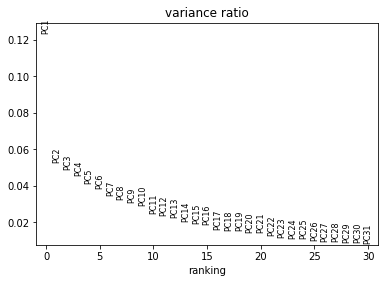

In [19]:
sc.tl.pca(adata, svd_solver='arpack')
plt.rcParams['figure.facecolor'] = 'white'
sc.pl.pca_variance_ratio(adata, log=False)

In [20]:
#sc.pp.subsample(adata,0.1)

In [21]:
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=0)

In [22]:
sc.tl.leiden(adata,resolution=1.0)

In [27]:
sc.tl.umap(adata,min_dist=0.4)

In [ ]:
plt.rcParams['figure.facecolor'] = 'white'
sc.set_figure_params(figsize=(6,5),dpi=100)
sc.pl.umap(adata,color=['leiden'],cmap='hsv',s=10)#,'total_counts'])#,save='chickbrain_UMAP_bins.pdf')

In [ ]:
pd.crosstab(adata.obs['sample'],adata.obs['condition'])

In [ ]:
plt.rcParams['figure.facecolor'] = 'white'
sc.set_figure_params(figsize=(14,10),dpi=600)
sc.pl.umap(adata,color=['condition'],cmap='hsv',s=30)#,'total_counts'])#,save='chickbrain_UMAP_bins.pdf')

In [ ]:
plt.rcParams['figure.facecolor'] = 'white'
sc.set_figure_params(figsize=(14,10),dpi=600)
sc.pl.umap(adata,color=['sample'],cmap='hsv',s=30)#,'total_counts'])#,save='chickbrain_UMAP_bins.pdf')

In [ ]:
plt.rcParams['figure.facecolor'] = 'white'
sc.set_figure_params(figsize=(14,10),dpi=600)
sc.pl.umap(adata,color=['leiden'],cmap='hsv',s=30)#,'total_counts'])#,save='chickbrain_UMAP_bins.pdf')

In [62]:
cluster_by_sample=pd.crosstab(adata.obs['leiden'],adata.obs['sample'])

In [75]:
cdv=cluster_by_sample.div(cluster_by_sample.sum(axis=0),axis=1)

In [97]:
cd=cdv.div(cdv.sum(axis=1),axis=0)

<AxesSubplot:xlabel='sample', ylabel='leiden'>

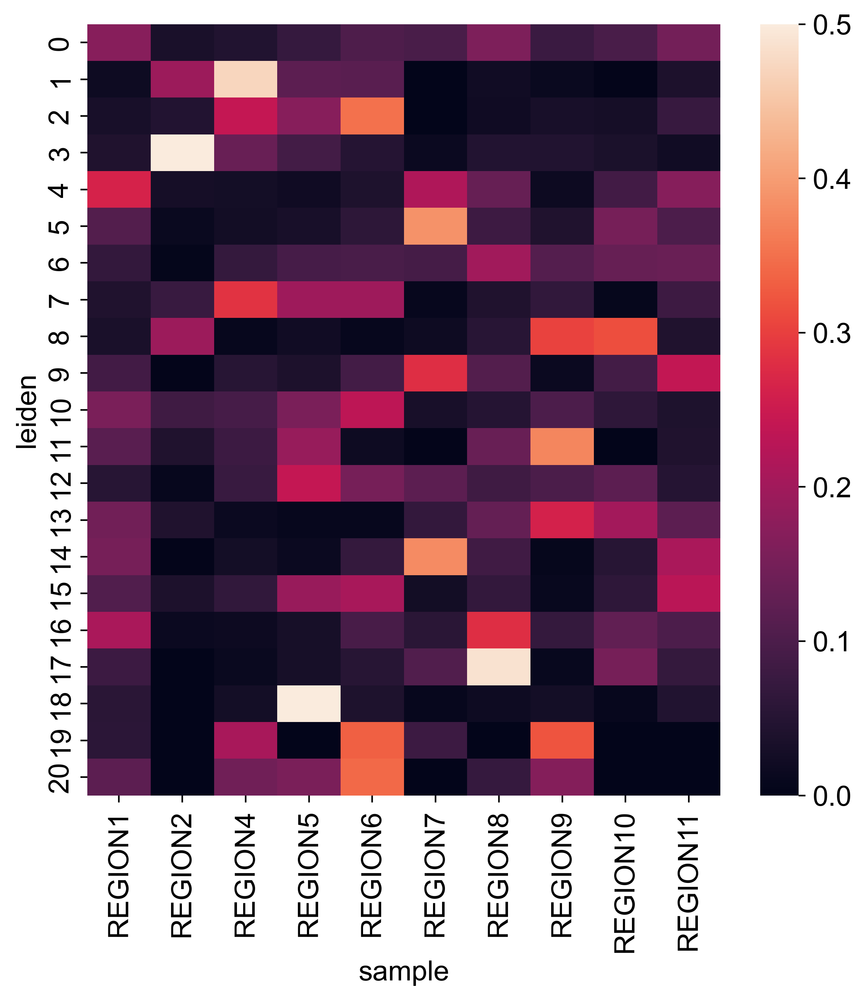

In [99]:
plt.figure(figsize=(7,7))
sns.heatmap(cd,vmax=0.5)

In [100]:
adata.write('F:/Analysis/adata/adata_10asthma_clustered.h5ad')

In [102]:
adata.raw.X

array([[0.       , 0.       , 0.       , ..., 0.       , 0.       ,
        0.       ],
       [0.       , 0.       , 0.       , ..., 0.       , 0.       ,
        0.       ],
       [0.       , 0.       , 0.       , ..., 0.       , 2.3978953,
        0.       ],
       ...,
       [0.       , 0.       , 0.       , ..., 0.       , 0.       ,
        0.       ],
       [0.       , 0.       , 0.       , ..., 0.       , 0.       ,
        0.       ],
       [0.       , 0.       , 0.       , ..., 0.       , 0.       ,
        0.       ]], dtype=float32)

In [50]:
plt.rcParams['figure.facecolor'] = 'white'
sc.set_figure_params(figsize=(14,10),dpi=600)
sc.pl.umap(adata,color=['total_counts'],cmap='hsv',s=30)#,'total_counts'])#,save='chickbrain_UMAP_bins.pdf')

In [59]:
sc.tl.rank_genes_groups(adata, 'leiden', method='wilcoxon')
sc.set_figure_params(figsize=(5,5),dpi=200)
sc.pl.rank_genes_groups(adata, n_genes=5, sharey=False,fontsize=14)

In [37]:
def map_of_clusters(adata,key='leiden',clusters='all',size=8,background='white',figuresize=(10,7),save=None,format='pdf'):
    
    #PARAMETERS TO MODIFY:
    #-key: the terms in adata.obs that you want to plot
    #-clusters:'all' for plotting all clusters in a single plot, 'individual': for plots of individual genes, or ['3','5'] (your groups
    #          between square brackets to plot only some clusters
    #-size: to change the size of your spots
    #-background: to change the color of the background
    #-figuresize: to specify the size of your figure
    #-save: if you want to save your figure, give the PATH of the folder where you want to save it
    #-format: specify the format in which you want to save your figure
    
    try:
        adata.obs[key]=adata.obs[key].astype(int)
        colors=dict(zip(np.unique(adata.obs[key]),adata.uns[key+'_colors']))
    except:
        colors=dict(zip(np.unique(adata.obs[key]),adata.uns[key+'_colors']))
    #cl.apply(lambda x: colors[x])
    plt.rcParams['figure.facecolor'] = background
    if clusters=='all':
        cl=adata.obs[key]
        plt.figure(figsize=figuresize)
        figa=plt.scatter(x=adata.obs.X,y=adata.obs.Y,c=cl.apply(lambda x: colors[x]),s=size,linewidths=0, edgecolors=None)
        plt.axis('off')
        if not save==None:
            plt.savefig(save +'/map_all_clusters_'+str(size)+'_'+background+'_'+key+'.'+format)
    elif clusters=='individual':
        cl=adata.obs[key]
        for each in adata.obs[key].unique():
            adatasub=adata[adata.obs[key]==each]
            plt.figure(figsize=figuresize)
            plt.scatter(x=adata.obs.X,y=adata.obs.Y,c='grey',s=size/5,linewidths=0, edgecolors=None)
            cl=adatasub.obs[key]
            plt.scatter(x=adatasub.obs.X,y=adatasub.obs.Y,c=cl.apply(lambda x: colors[x]),s=size,linewidths=0, edgecolors=None)
            plt.axis('off')
            plt.title('Group: '+ str(each))
            if not save==None:
                plt.savefig(save +'/map_inidivdual_cluster_'+str(each)+'_'+str(size)+background+'_'+key+'.'+format)
    else:
        adatasub=adata[adata.obs[key].isin(clusters)]
        plt.figure(figsize=figuresize)
        plt.scatter(x=adata.obs.X,y=adata.obs.Y,c='grey',s=size/5,linewidths=0, edgecolors=None)
        cl=adatasub.obs[key]
        plt.scatter(x=adatasub.obs.X,y=adatasub.obs.Y,c=cl.apply(lambda x: colors[x]),s=size,linewidths=0, edgecolors=None)
        plt.axis('off')
        plt.legend()
        if not save==None:
                s=''
                for element in clusters:
                    s=s+str(element)
                print(s)
                plt.savefig(save +'/map_group_of_clusters_'+str(s)+'_'+str(size)+background+'_'+key+'.'+format)
#        plt.title('Group: '+ paste(clusters))

In [ ]:
adata.obs['X']=adata.obs['x']
adata.obs['Y']=adata.obs['y']
for a in adata.obs['sample'].unique():
    ads=adata[adata.obs['sample']==a]
#    sc.pl.umap(ads,color=['leiden'],cmap='hsv',s=30)#,'total_counts'])#,save='chickbrain_UMAP_bins.pdf')
    map_of_clusters(ads,figuresize=(7,7),size=20,clusters='all')